 # Lane Detection & Road Departure Warning Using Computer Vision

This project implements a computer vision pipeline for detecting lane boundaries
from road images and videos and estimating whether the camera/vehicle is moving
toward a lane boundary.

The system uses classical computer vision techniques including:

- Grayscale conversion
- Gaussian filtering
- Canny edge detection
- Region-of-interest masking
- Hough Line Transform
- Polynomial lane fitting
- Temporal smoothing
- Lane-center estimation
- Road departure warning

The project is designed as a practical computer vision application without
requiring a large deep-learning model.

## Pipeline

Input Image / Video
→ Preprocessing
→ Edge Detection
→ Region of Interest
→ Lane Detection
→ Lane Fitting
→ Temporal Smoothing
→ Lane Center Estimation
→ Departure Warning
→ Visualization

In [216]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

from pathlib import Path
from collections import deque

from IPython.display import Video, display

print("OpenCV version:", cv2.__version__)
print("NumPy version:", np.__version__)

OpenCV version: 4.13.0
NumPy version: 2.0.2


In [217]:
from pathlib import Path

DATASET_ROOT = Path("/kaggle/input/datasets/manideep1108/tusimple")
TUSIMPLE_ROOT = DATASET_ROOT / "TUSimple"

TRAIN_ROOT = TUSIMPLE_ROOT / "train_set"
TEST_ROOT = TUSIMPLE_ROOT / "test_set"

print("Train:", TRAIN_ROOT)
print("Test :", TEST_ROOT)

print("\nTrain exists:", TRAIN_ROOT.exists())
print("Test exists :", TEST_ROOT.exists())

Train: /kaggle/input/datasets/manideep1108/tusimple/TUSimple/train_set
Test : /kaggle/input/datasets/manideep1108/tusimple/TUSimple/test_set

Train exists: True
Test exists : True


In [218]:
import json

json_files = list(DATASET_ROOT.rglob("*.json"))

print(f"Found {len(json_files)} JSON files:\n")

for f in json_files:
    print(f)

Found 8 JSON files:

/kaggle/input/datasets/manideep1108/tusimple/test_label_new.json
/kaggle/input/datasets/manideep1108/tusimple/TUSimple/test_label.json
/kaggle/input/datasets/manideep1108/tusimple/TUSimple/test_set/test_tasks_0627.json
/kaggle/input/datasets/manideep1108/tusimple/TUSimple/train_set/label_data_0601.json
/kaggle/input/datasets/manideep1108/tusimple/TUSimple/train_set/label_data_0313.json
/kaggle/input/datasets/manideep1108/tusimple/TUSimple/train_set/label_data_0531.json
/kaggle/input/datasets/manideep1108/tusimple/TUSimple/train_set/seg_label/train_val.json
/kaggle/input/datasets/manideep1108/tusimple/TUSimple/train_set/seg_label/test.json


In [219]:
train_images = list(TRAIN_ROOT.rglob("*.jpg"))
test_images = list(TEST_ROOT.rglob("*.jpg"))

print("Training images:", len(train_images))
print("Test images:", len(test_images))

print("\nExample training image:")
print(train_images[0] if train_images else "None")

print("\nExample test image:")
print(test_images[0] if test_images else "None")

Training images: 72520
Test images: 55640

Example training image:
/kaggle/input/datasets/manideep1108/tusimple/TUSimple/train_set/clips/0531/1492629775931278791/20.jpg

Example test image:
/kaggle/input/datasets/manideep1108/tusimple/TUSimple/test_set/clips/0531/1492628880603080608/20.jpg


In [220]:
label_path = TUSIMPLE_ROOT / "train_set" / "label_data_0601.json"

with open(label_path, "r") as f:
    first_line = f.readline()

sample_annotation = json.loads(first_line)

print("Keys:")
print(sample_annotation.keys())

print("\nRaw file:")
print(sample_annotation["raw_file"])

print("\nNumber of lanes:")
print(len(sample_annotation["lanes"]))

print("\nNumber of h_samples:")
print(len(sample_annotation["h_samples"]))

Keys:
dict_keys(['lanes', 'h_samples', 'raw_file'])

Raw file:
clips/0601/1494453497604532231/20.jpg

Number of lanes:
4

Number of h_samples:
56


In [221]:
sample_annotation

{'lanes': [[-2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   567,
   532,
   496,
   461,
   425,
   390,
   355,
   319,
   284,
   248,
   213,
   177,
   142,
   106,
   71,
   35,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2],
  [-2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   646,
   633,
   621,
   609,
   596,
   584,
   571,
   559,
   546,
   534,
   522,
   509,
   497,
   484,
   472,
   460,
   447,
   435,
   422,
   410,
   397,
   385,
   373,
   360,
   348,
   335,
   323,
   311,
   298,
   286,
   273,
   261,
   248,
   236,
   224,
   211,
   199,
   186,
   174,
   162,
   149,
   137,
   124,
   112,
   100,
   87],
  [-2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   -2,
   690,
   702,
   713,
   724,
   736,
   747,
   758,
   770,
   78

In [222]:
def resolve_image_path(raw_file, split="train"):
    raw_file = Path(raw_file)

    candidates = [
        TUSIMPLE_ROOT / raw_file,
        TUSIMPLE_ROOT / f"{split}_set" / raw_file,
        DATASET_ROOT / raw_file,
    ]

    for path in candidates:
        if path.exists():
            return path

    return None


image_path = resolve_image_path(
    sample_annotation["raw_file"],
    split="train"
)

print("Image path:", image_path)

image = cv2.imread(str(image_path))

if image is None:
    raise FileNotFoundError(f"Could not load image: {image_path}")

print("Image shape:", image.shape)

Image path: /kaggle/input/datasets/manideep1108/tusimple/TUSimple/train_set/clips/0601/1494453497604532231/20.jpg
Image shape: (720, 1280, 3)


In [223]:
def draw_ground_truth_lanes(image, annotation):
    output = image.copy()

    h_samples = annotation["h_samples"]
    lanes = annotation["lanes"]

    for lane_idx, lane in enumerate(lanes):

        points = []

        for x, y in zip(lane, h_samples):

            # -2 means the lane is not visible
            if x >= 0:
                points.append((int(x), int(y)))

        if len(points) >= 2:
            points = np.array(points, dtype=np.int32)

            cv2.polylines(
                output,
                [points],
                False,
                (0, 255, 0),
                4
            )

    return output

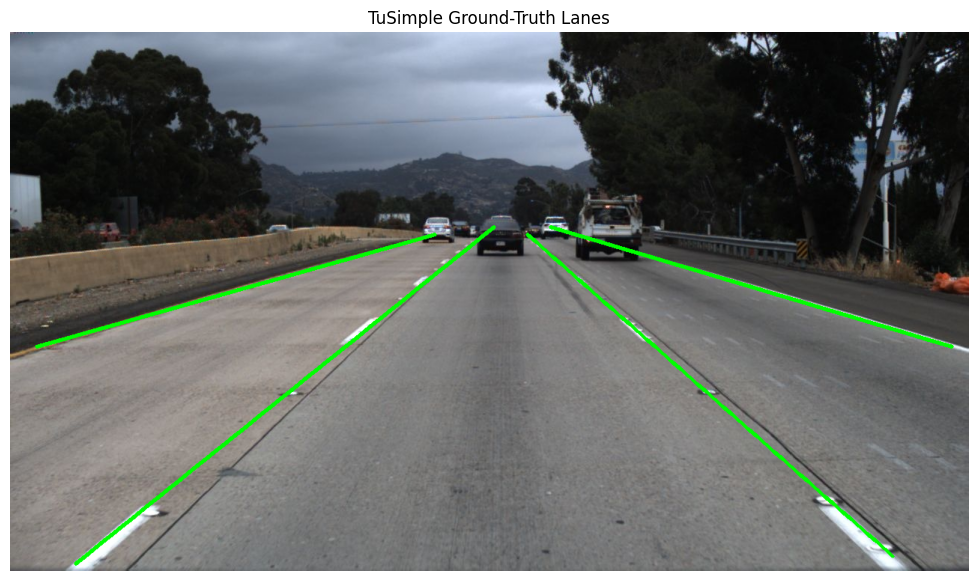

In [224]:
gt_image = draw_ground_truth_lanes(
    image,
    sample_annotation
)

gt_rgb = cv2.cvtColor(
    gt_image,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(14, 7))
plt.imshow(gt_rgb)
plt.title("TuSimple Ground-Truth Lanes")
plt.axis("off")
plt.show()

In [225]:
def draw_numbered_ground_truth(image, annotation):
    output = image.copy()

    h_samples = annotation["h_samples"]
    lanes = annotation["lanes"]

    for lane_idx, lane in enumerate(lanes):

        points = [
            (int(x), int(y))
            for x, y in zip(lane, h_samples)
            if x >= 0
        ]

        if len(points) < 2:
            continue

        points_array = np.array(points, dtype=np.int32)

        cv2.polylines(
            output,
            [points_array],
            False,
            (0, 255, 0),
            4
        )

        # Put lane number near the first visible point
        x, y = points[0]

        cv2.putText(
            output,
            f"Lane {lane_idx + 1}",
            (x + 5, y - 10),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.7,
            (255, 255, 0),
            2,
            cv2.LINE_AA
        )

    return output

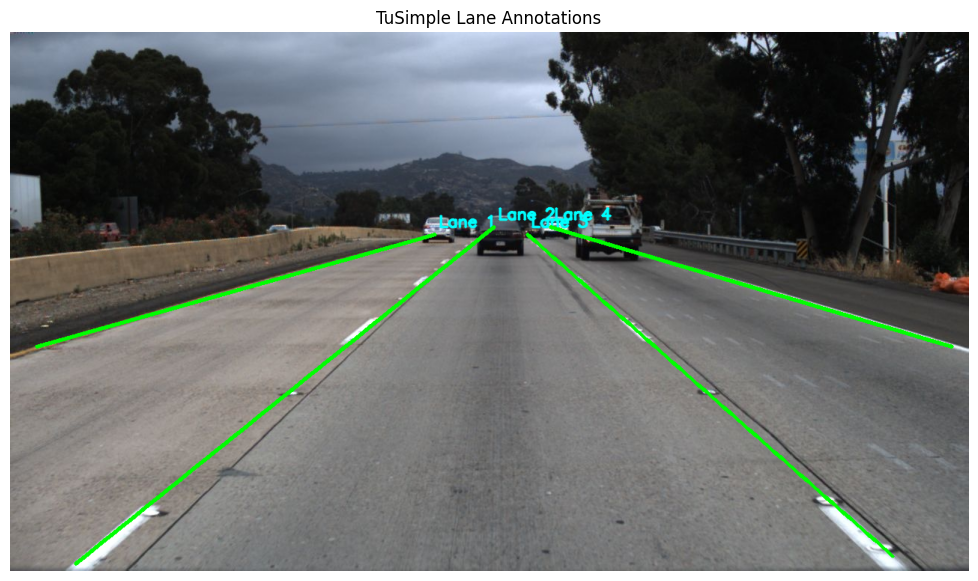

In [226]:
numbered_gt = draw_numbered_ground_truth(
    image,
    sample_annotation
)

numbered_gt_rgb = cv2.cvtColor(
    numbered_gt,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(14, 7))
plt.imshow(numbered_gt_rgb)
plt.title("TuSimple Lane Annotations")
plt.axis("off")
plt.show()

## Configuration

Update the input directory below according to the Kaggle dataset you attach.

The rest of the notebook is designed to work with the configured paths.

## Image Preprocessing

The first stage converts the image to grayscale and applies Gaussian smoothing.

Grayscale reduces the problem to one intensity channel, while Gaussian
filtering reduces small image variations and noise before edge detection.

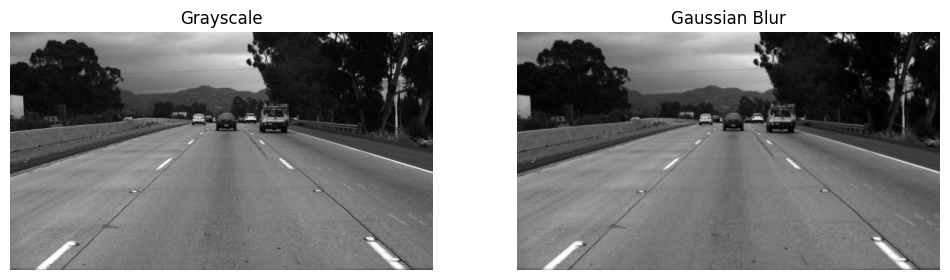

In [227]:
def preprocess_image(image_rgb):
    gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    return gray, blurred


gray, blurred = preprocess_image(image)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(gray, cmap="gray")
plt.title("Grayscale")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(blurred, cmap="gray")
plt.title("Gaussian Blur")
plt.axis("off")

plt.show()

## Canny Edge Detection

Canny edge detection identifies strong intensity changes that can correspond
to lane markings and road boundaries.

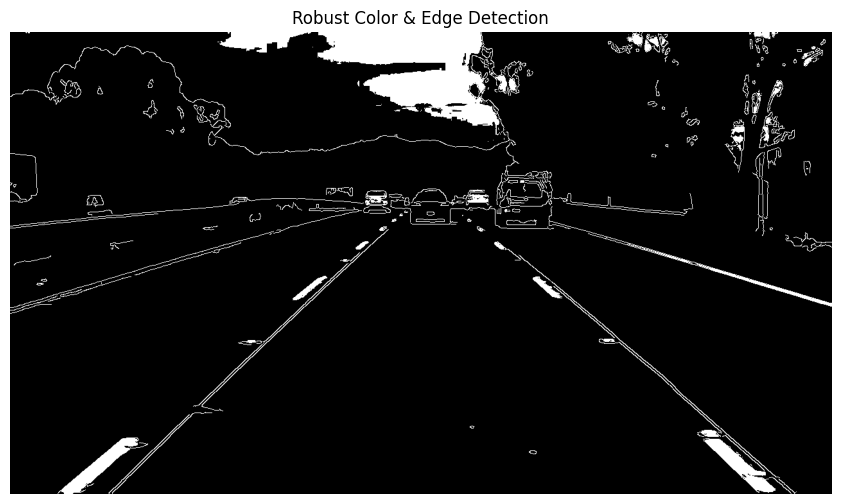

In [228]:
def detect_edges(image_rgb):
    """
    Extracts clean lane edges by combining White/Yellow color masking
    with Canny edge detection, suppressing shadows and road surface noise.
    """
    # 1. HLS color filtering for White and Yellow lane markings
    hls = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2HLS)
    
    # White: high lightness
    lower_white = np.array([0, 185, 0], dtype=np.uint8)
    upper_white = np.array([255, 255, 255], dtype=np.uint8)
    white_mask = cv2.inRange(hls, lower_white, upper_white)
    
    # Yellow: yellow hue and sufficient saturation
    lower_yellow = np.array([10, 60, 60], dtype=np.uint8)
    upper_yellow = np.array([40, 255, 255], dtype=np.uint8)
    yellow_mask = cv2.inRange(hls, lower_yellow, upper_yellow)
    
    color_mask = cv2.bitwise_or(white_mask, yellow_mask)
    
    # 2. Canny edge detection on blurred grayscale
    gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    canny_edges = cv2.Canny(blurred, 50, 150)
    
    # Combine color mask with edge detection
    combined = cv2.bitwise_or(canny_edges, color_mask)
    return combined


edges = detect_edges(image)
plt.figure(figsize=(12, 6))
plt.imshow(edges, cmap="gray")
plt.title("Robust Color & Edge Detection")
plt.axis("off")
plt.show()


## Region of Interest

Lane markings are usually relevant in the lower portion of the road image.

A trapezoidal region is therefore used to remove irrelevant areas before
lane detection.

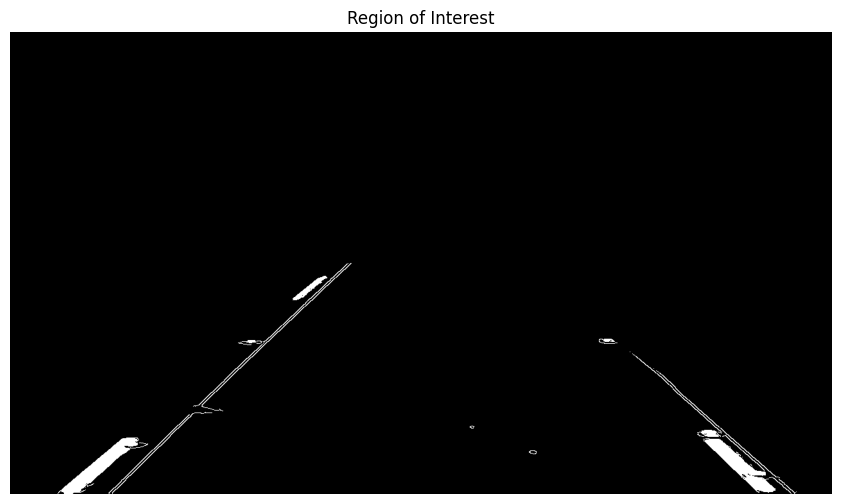

In [229]:
def region_of_interest(edges):
    height, width = edges.shape
    mask = np.zeros_like(edges)
    
    polygon = np.array([[
        (0, height),
        (width, height),
        (int(width * 0.60), int(height * 0.50)),
        (int(width * 0.40), int(height * 0.50))
    ]], dtype=np.int32)
    
    cv2.fillPoly(mask, polygon, 255)
    masked_edges = cv2.bitwise_and(edges, mask)
    return masked_edges, polygon


roi_edges, roi_polygon = region_of_interest(edges)
plt.figure(figsize=(12, 6))
plt.imshow(roi_edges, cmap="gray")
plt.title("Region of Interest")
plt.axis("off")
plt.show()


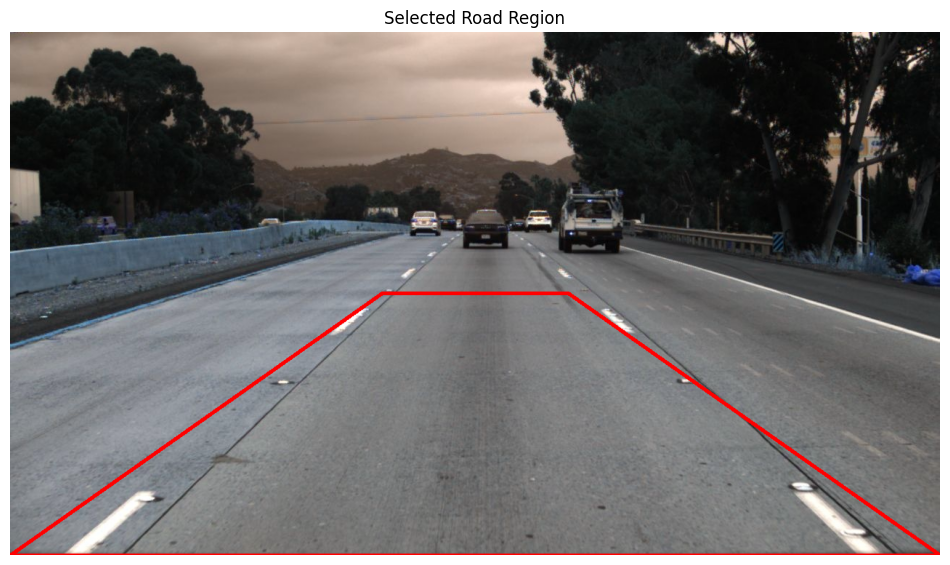

In [230]:
def draw_roi(image_rgb, polygon):
    output = image_rgb.copy()
    
    cv2.polylines(
        output,
        [polygon],
        isClosed=True,
        color=(255, 0, 0),
        thickness=3
    )
    
    return output


roi_visualization = draw_roi(image, roi_polygon)

plt.figure(figsize=(12, 7))
plt.imshow(roi_visualization)
plt.title("Selected Road Region")
plt.axis("off")
plt.show()

## Hough Line Transform

The probabilistic Hough Line Transform is used to detect line segments
inside the road region.

These segments are later grouped into left and right lane candidates.

In [231]:
def detect_hough_lines(edges):
    lines = cv2.HoughLinesP(
        edges,
        rho=1,
        theta=np.pi / 180,
        threshold=35,
        minLineLength=30,
        maxLineGap=80
    )
    return lines


lines = detect_hough_lines(roi_edges)
print("Detected line segments:", 0 if lines is None else len(lines))


Detected line segments: 69


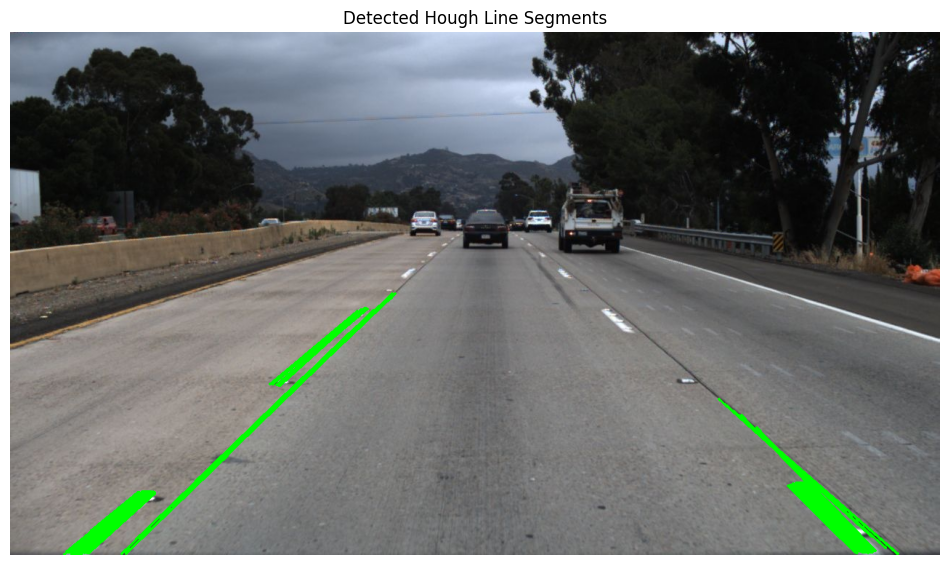

In [232]:
def draw_hough_lines(image_rgb, lines):
    output = image_rgb.copy()
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(output, (x1, y1), (x2, y2), (0, 255, 0), 2)
    return output


hough_visualization = draw_hough_lines(image, lines)
vis_rgb = cv2.cvtColor(hough_visualization, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12, 7))
plt.imshow(vis_rgb)
plt.title("Detected Hough Line Segments")
plt.axis("off")
plt.show()


In [233]:
def separate_lane_lines(lines, image_shape):
    """
    Classify Hough line segments into left and right lane candidates.
    """
    height, width = image_shape[:2]
    left_lines = []
    right_lines = []

    if lines is None:
        return left_lines, right_lines

    for line in lines:
        x1, y1, x2, y2 = line[0]
        if x2 == x1:
            continue

        dx = x2 - x1
        dy = y2 - y1
        slope = dx / dy if dy != 0 else 0

        # Filter out horizontal noise
        if abs(dy) < 15 or abs(slope) < 0.25 or abs(slope) > 2.5:
            continue

        midpoint_x = (x1 + x2) / 2

        # Left lane candidate (negative dx/dy, left half)
        if midpoint_x < width * 0.52 and slope < 0:
            left_lines.append((x1, y1, x2, y2))
        # Right lane candidate (positive dx/dy, right half)
        elif midpoint_x > width * 0.48 and slope > 0:
            right_lines.append((x1, y1, x2, y2))

    return left_lines, right_lines


left_lines, right_lines = separate_lane_lines(lines, image.shape)
print(f"Left lane segments: {len(left_lines)}")
print(f"Right lane segments: {len(right_lines)}")


Left lane segments: 38
Right lane segments: 31


In [234]:
def fit_lane_line(line_segments):
    """
    Fits x = slope * y + intercept with median-slope outlier rejection.
    """
    if not line_segments:
        return None

    slopes = []
    valid_segments = []
    for x1, y1, x2, y2 in line_segments:
        dy = y2 - y1
        dx = x2 - x1
        if dy != 0:
            m = dx / dy
            slopes.append(m)
            valid_segments.append((x1, y1, x2, y2))

    if not slopes:
        return None

    med_slope = np.median(slopes)
    x_points = []
    y_points = []
    for (x1, y1, x2, y2), m in zip(valid_segments, slopes):
        if abs(m - med_slope) < 0.35:
            x_points.extend([x1, x2])
            y_points.extend([y1, y2])

    if len(x_points) < 2 or len(set(y_points)) < 2:
        return None

    fit = np.polyfit(y_points, x_points, 1)
    return fit


def complete_single_lane(left_fit, right_fit, image_shape):
    """
    When one boundary is occluded by traffic cones, trucks, or dashed gaps,
    reconstruct the opposing boundary using standard highway lane geometry (3.7m width).
    """
    height, width = image_shape[:2]
    y_top = int(height * 0.50)
    y_bot = height
    
    # Calibrated highway lane width: 850px at bumper base, 280px at horizon
    lane_w_bot = 850
    lane_w_top = 280
    
    if left_fit is not None and right_fit is not None:
        return left_fit, right_fit, "DUAL_LANE"
        
    elif left_fit is not None and right_fit is None:
        left_bot = left_fit[0] * y_bot + left_fit[1]
        left_top = left_fit[0] * y_top + left_fit[1]
        right_bot = min(width - 1, left_bot + lane_w_bot)
        right_top = min(width - 1, left_top + lane_w_top)
        m_r = (right_bot - right_top) / (y_bot - y_top)
        b_r = right_bot - m_r * y_bot
        return left_fit, np.array([m_r, b_r]), "LEFT_ONLY"
        
    elif right_fit is not None and left_fit is None:
        right_bot = right_fit[0] * y_bot + right_fit[1]
        right_top = right_fit[0] * y_top + right_fit[1]
        left_bot = max(0, right_bot - lane_w_bot)
        left_top = max(0, right_top - lane_w_top)
        m_l = (left_bot - left_top) / (y_bot - y_top)
        b_l = left_bot - m_l * y_bot
        return np.array([m_l, b_l]), right_fit, "RIGHT_ONLY"
        
    return None, None, "NONE"


In [235]:
left_fit = fit_lane_line(left_lines)
right_fit = fit_lane_line(right_lines)
print("Left fit:", left_fit)
print("Right fit:", right_fit)


Left fit: [ -1.18165737 946.18984611]
Right fit: [  0.98903412 472.42112513]


In [236]:
def lane_points_from_fit(fit, image_shape):
    """
    Convert fitted line x = slope * y + intercept into drawable image endpoints.
    """
    if fit is None:
        return None

    slope, intercept = fit
    height, width = image_shape[:2]

    y_bottom = height
    y_top = int(height * 0.52)

    x_bottom = int(slope * y_bottom + intercept)
    x_top = int(slope * y_top + intercept)

    x_bottom = np.clip(x_bottom, 0, width - 1)
    x_top = np.clip(x_top, 0, width - 1)

    return (
        (int(x_bottom), int(y_bottom)),
        (int(x_top), int(y_top))
    )


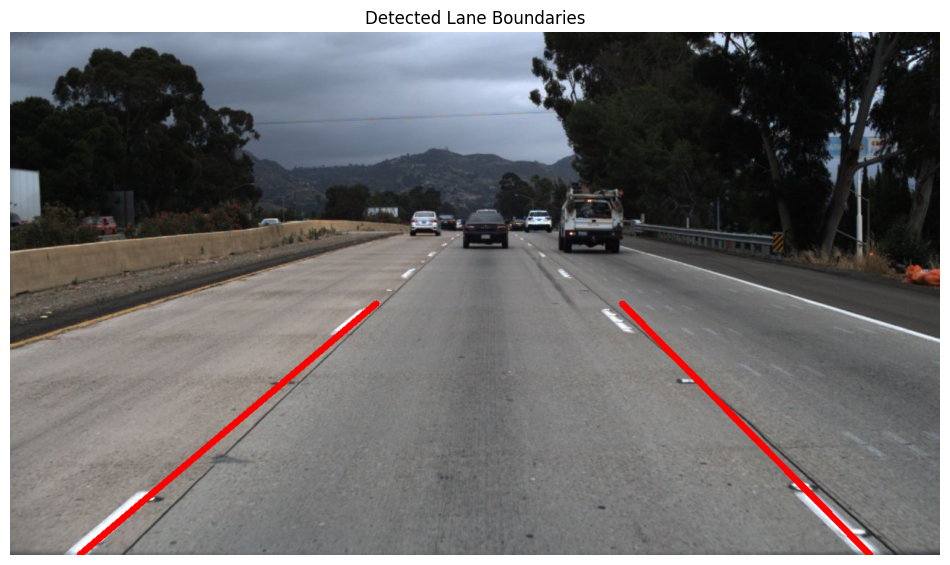

In [237]:
def draw_lane_lines(image_rgb, left_fit, right_fit):
    output = image_rgb.copy()
    left_points = lane_points_from_fit(left_fit, image_rgb.shape)
    right_points = lane_points_from_fit(right_fit, image_rgb.shape)

    # Draw distinct red boundary lines
    if left_points is not None:
        cv2.line(output, left_points[0], left_points[1], (255, 0, 0), 8)
    if right_points is not None:
        cv2.line(output, right_points[0], right_points[1], (255, 0, 0), 8)
    return output


# Ensure image is in RGB format
img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) if len(image.shape) == 3 else image
lane_visualization = draw_lane_lines(img_rgb, left_fit, right_fit)

plt.figure(figsize=(12, 7))
plt.imshow(lane_visualization)
plt.title("Detected Lane Boundaries")
plt.axis("off")
plt.show()


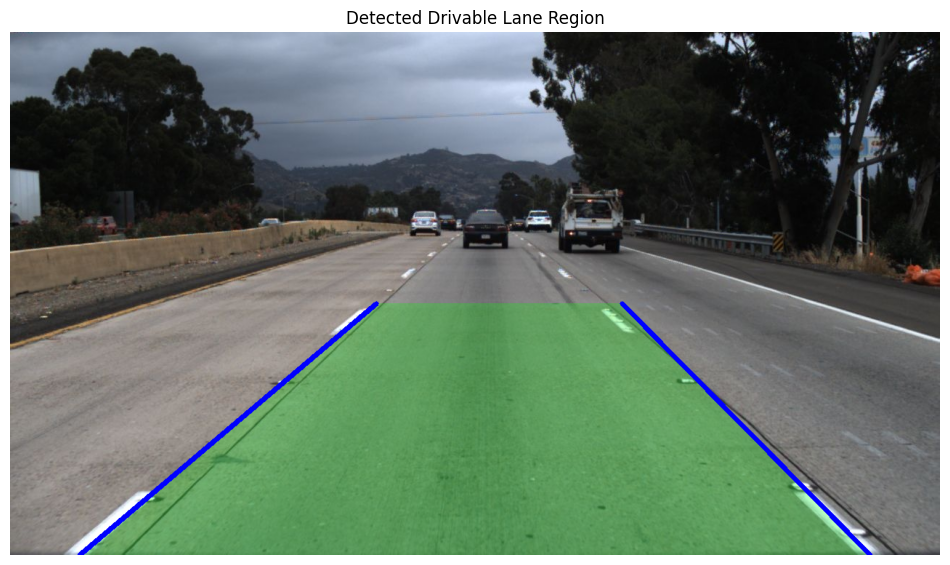

In [238]:
def draw_lane_area(image_rgb, left_fit, right_fit):
    output = image_rgb.copy()
    left_points = lane_points_from_fit(left_fit, image_rgb.shape)
    right_points = lane_points_from_fit(right_fit, image_rgb.shape)

    if left_points is not None and right_points is not None:
        polygon = np.array([
            left_points[0],
            left_points[1],
            right_points[1],
            right_points[0]
        ], dtype=np.int32)
        overlay = image_rgb.copy()
        cv2.fillPoly(overlay, [polygon], (0, 255, 0))
        output = cv2.addWeighted(image_rgb, 0.75, overlay, 0.25, 0)

    if left_points is not None:
        cv2.line(output, left_points[0], left_points[1], (255, 0, 0), 6)
    if right_points is not None:
        cv2.line(output, right_points[0], right_points[1], (255, 0, 0), 6)
    return output


lane_area = draw_lane_area(image, left_fit, right_fit)
vis_rgb = cv2.cvtColor(lane_area, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12, 7))
plt.imshow(vis_rgb)
plt.title("Detected Drivable Lane Region")
plt.axis("off")
plt.show()


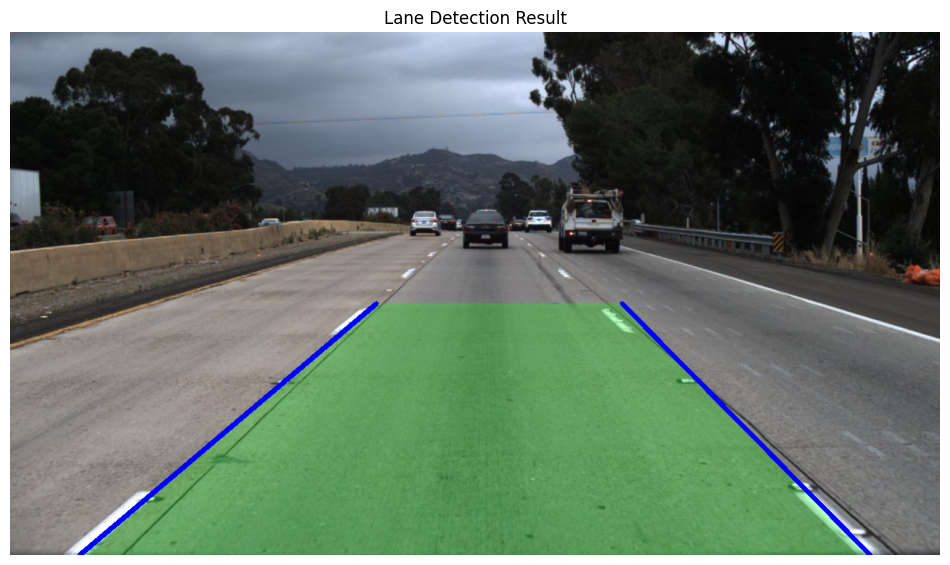

In [239]:
def detect_lanes(image_rgb):
    """
    Robust lane detection pipeline with single-lane occlusion recovery.
    """
    # 1. Color + edge mask
    edges = detect_edges(image_rgb)
    
    # 2. ROI mask
    roi_edges, _ = region_of_interest(edges)
    
    # 3. Hough line transform
    lines = detect_hough_lines(roi_edges)
    
    # 4. Separate left and right line candidates
    left_lines, right_lines = separate_lane_lines(lines, image_rgb.shape)
    
    # 5. Fit robust lines with median outlier rejection
    left_fit = fit_lane_line(left_lines)
    right_fit = fit_lane_line(right_lines)
    
    # 6. Single-lane recovery: estimate opposing boundary if occluded by traffic/cones
    left_fit, right_fit, mode = complete_single_lane(left_fit, right_fit, image_rgb.shape)
    
    return left_fit, right_fit


left_fit, right_fit = detect_lanes(image)
result = draw_lane_area(image, left_fit, right_fit)
vis_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12, 7))
plt.imshow(vis_rgb)
plt.title("Lane Detection Result")
plt.axis("off")
plt.show()


## Lane Center Estimation

The approximate lane center is calculated from the detected left and right
lane boundaries.

The camera center is used as an approximation for the vehicle center.

The difference between these two positions provides a simple lateral offset
measurement.

In [240]:
def get_lane_x(fit, y):
    if fit is None:
        return None
    return fit[0] * y + fit[1]


def calculate_lane_center(left_fit, right_fit, y):
    left_x = get_lane_x(left_fit, y)
    right_x = get_lane_x(right_fit, y)
    if left_x is None or right_x is None:
        return None
    return (left_x + right_x) / 2


In [241]:
def calculate_offset(image_shape, left_fit, right_fit):
    height, width = image_shape[:2]
    vehicle_center = width / 2
    y_reference = height
    lane_center = calculate_lane_center(left_fit, right_fit, y_reference)
    if lane_center is None:
        return None, vehicle_center, None
    offset = vehicle_center - lane_center
    return offset, vehicle_center, lane_center


In [242]:
def departure_warning(offset, image_width, threshold_ratio=0.08):
    if offset is None:
        return "LANE NOT DETECTED"
    
    threshold = image_width * threshold_ratio
    
    if offset > threshold:
        return "WARNING: DRIFTING LEFT"
    
    elif offset < -threshold:
        return "WARNING: DRIFTING RIGHT"
    
    else:
        return "CENTERED"

In [243]:
def visualize_departure_warning(image_rgb, left_fit, right_fit):
    output = draw_lane_area(image_rgb, left_fit, right_fit)
    offset, vehicle_center, lane_center = calculate_offset(image_rgb.shape, left_fit, right_fit)
    status = departure_warning(offset, image_rgb.shape[1])
    height, width = image_rgb.shape[:2]
    if vehicle_center is None:
        vehicle_center = width / 2
    cv2.line(output, (int(vehicle_center), height), (int(vehicle_center), int(height * 0.75)), (255, 255, 0), 4)
    if lane_center is not None:
        cv2.circle(output, (int(lane_center), height - 20), 10, (255, 0, 255), -1)
    offset_text = f'Lane Offset: {offset:.1f} px' if offset is not None else 'Lane Offset: N/A'
    cv2.putText(output, status, (30, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255, 255, 255), 3)
    cv2.putText(output, offset_text, (30, 90), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)
    return output, status, offset


Status: CENTERED
Offset: 0.03888478343935731


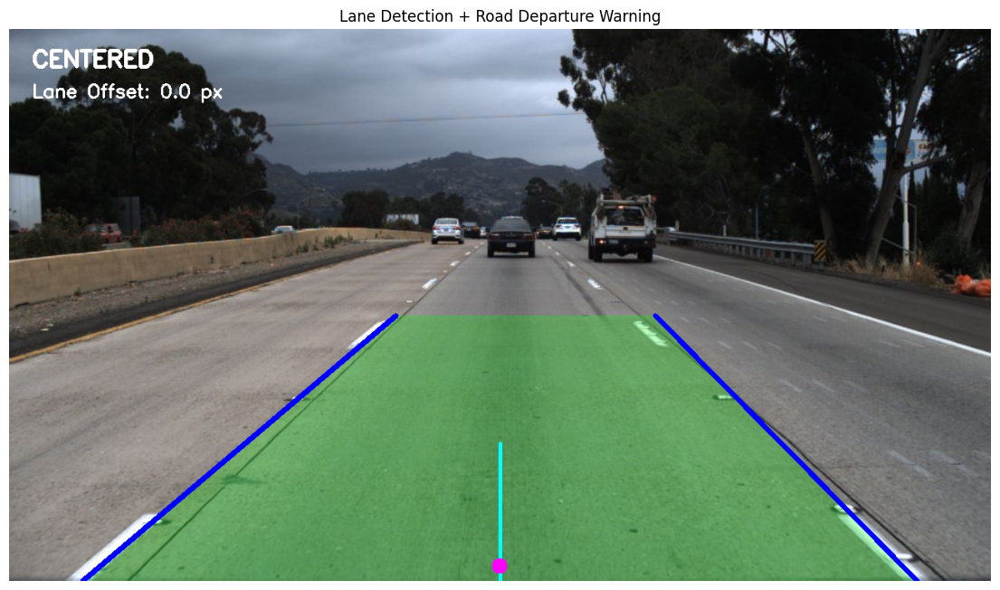

In [244]:
warning_result, status, offset = visualize_departure_warning(image, left_fit, right_fit)
print("Status:", status)
print("Offset:", offset)
vis_rgb = cv2.cvtColor(warning_result, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(14, 8))
plt.imshow(vis_rgb)
plt.title("Lane Detection + Road Departure Warning")
plt.axis("off")
plt.show()


# Curved Lane Detection

Straight-line fitting can fail when the road contains curved lane markings.

To handle this case, lane pixels are fitted using a second-degree polynomial:

    x = a*y² + b*y + c

This allows the detected lane boundaries to curve with the road.

In [245]:
def collect_lane_points(lines):
    if lines is None:
        return np.array([]), np.array([])
    
    xs = []
    ys = []
    
    for line in lines:
        x1, y1, x2, y2 = line[0]
        
        xs.extend([x1, x2])
        ys.extend([y1, y2])
    
    return np.array(xs), np.array(ys)

In [246]:
def polynomial_lane_fit(lines, max_curvature=1e-3):
    x_points, y_points = collect_lane_points(lines)
    if len(x_points) < 4:
        return None
    try:
        fit = np.polyfit(y_points, x_points, 2)
        a, b, c = fit
        # If curvature is too high or vertex loops back inside road, fallback to linear fit
        if abs(a) > max_curvature or (abs(a) > 1e-6 and 400 < (-b / (2 * a)) < 720):
            lin_fit = np.polyfit(y_points, x_points, 1)
            fit = np.array([0.0, lin_fit[0], lin_fit[1]])
        return fit
    except np.linalg.LinAlgError:
        return None


In [247]:
def draw_curved_lanes(
    image_rgb,
    left_fit,
    right_fit
):
    output = image_rgb.copy()
    
    if left_fit is None or right_fit is None:
        return output
    
    height, width = image_rgb.shape[:2]
    
    y_values = np.linspace(
        int(height * 0.58),
        height,
        100
    )
    
    left_x = (
        left_fit[0] * y_values**2
        + left_fit[1] * y_values
        + left_fit[2]
    )
    
    right_x = (
        right_fit[0] * y_values**2
        + right_fit[1] * y_values
        + right_fit[2]
    )
    
    left_points = np.array(
        list(zip(left_x, y_values)),
        dtype=np.int32
    )
    
    right_points = np.array(
        list(zip(right_x, y_values)),
        dtype=np.int32
    )
    
    cv2.polylines(
        output,
        [left_points],
        False,
        (255, 0, 0),
        6
    )
    
    cv2.polylines(
        output,
        [right_points],
        False,
        (255, 0, 0),
        6
    )
    
    polygon = np.vstack([
        left_points,
        right_points[::-1]
    ])
    
    overlay = output.copy()
    
    cv2.fillPoly(
        overlay,
        [polygon],
        (0, 255, 0)
    )
    
    output = cv2.addWeighted(
        output,
        0.75,
        overlay,
        0.25,
        0
    )
    
    return output

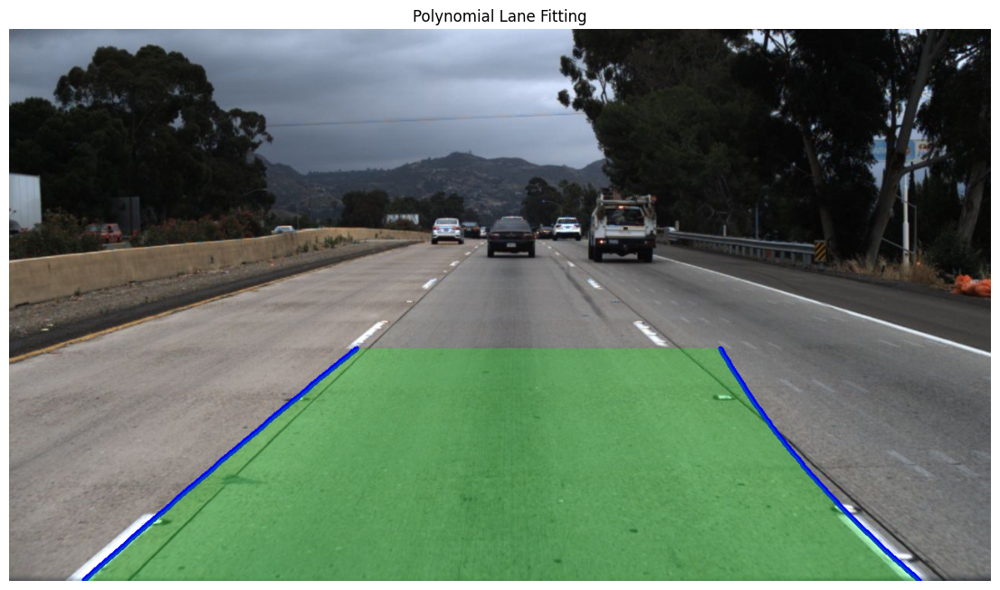

In [248]:
left_poly = polynomial_lane_fit(np.array(left_lines).reshape(-1, 1, 4) if len(left_lines) > 0 else None)
right_poly = polynomial_lane_fit(np.array(right_lines).reshape(-1, 1, 4) if len(right_lines) > 0 else None)
curved_result = draw_curved_lanes(image, left_poly, right_poly)
vis_rgb = cv2.cvtColor(curved_result, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(14, 8))
plt.imshow(vis_rgb)
plt.title("Polynomial Lane Fitting")
plt.axis("off")
plt.show()


# Temporal Smoothing

Lane detections may fluctuate between consecutive video frames.

A history buffer is used to smooth the detected lane parameters and produce
more stable lane boundaries.

In [249]:
class LaneSmoother:
    def __init__(self, max_history=8):
        self.left_history = deque(maxlen=max_history)
        self.right_history = deque(maxlen=max_history)
    
    def update(self, left_fit, right_fit):
        if left_fit is not None:
            self.left_history.append(left_fit)
        
        if right_fit is not None:
            self.right_history.append(right_fit)
        
        left_average = (
            np.mean(self.left_history, axis=0)
            if len(self.left_history) > 0
            else None
        )
        
        right_average = (
            np.mean(self.right_history, axis=0)
            if len(self.right_history) > 0
            else None
        )
        
        return left_average, right_average

In [250]:
def process_video(
    input_path,
    output_path,
    max_frames=None
):
    cap = cv2.VideoCapture(str(input_path))
    
    if not cap.isOpened():
        raise ValueError(f"Could not open video: {input_path}")
    
    fps = cap.get(cv2.CAP_PROP_FPS)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    
    if fps <= 0:
        fps = 25
    
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    
    writer = cv2.VideoWriter(
        str(output_path),
        fourcc,
        fps,
        (width, height)
    )
    
    smoother = LaneSmoother(max_history=8)
    
    frame_count = 0
    
    while True:
        ret, frame = cap.read()
        
        if not ret:
            break
        
        frame_rgb = cv2.cvtColor(
            frame,
            cv2.COLOR_BGR2RGB
        )
        
        left_fit, right_fit = detect_lanes(
            frame_rgb
        )
        
        left_fit, right_fit = smoother.update(
            left_fit,
            right_fit
        )
        
        result, status, offset = visualize_departure_warning(
            frame_rgb,
            left_fit,
            right_fit
        )
        
        result_bgr = cv2.cvtColor(
            result,
            cv2.COLOR_RGB2BGR
        )
        
        writer.write(result_bgr)
        
        frame_count += 1
        
        if max_frames is not None and frame_count >= max_frames:
            break
    
    cap.release()
    writer.release()
    
    return {
        "frames": frame_count,
        "fps": fps,
        "width": width,
        "height": height
    }

In [251]:
from pathlib import Path
OUTPUT_DIR = Path("/kaggle/working") if Path("/kaggle/working").exists() else Path("./output")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
video_files = list(DATASET_ROOT.rglob("*.mp4")) + list(Path(".").rglob("*.mp4"))
image_files = test_images if len(test_images) > 0 else train_images

def load_image(image_path):
    img = cv2.imread(str(image_path))
    if img is None:
        raise FileNotFoundError(f"Could not load image: {image_path}")
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

if len(video_files) > 0:
    input_video = video_files[0]
    print("Using video:", input_video)
else:
    input_video = None
    print("No video found. (TuSimple contains image clips; video processing will be skipped)")


No video found. (TuSimple contains image clips; video processing will be skipped)


In [252]:
if input_video is not None:
    
    output_video = OUTPUT_DIR / "lane_detection_result.mp4"
    
    video_info = process_video(
        input_video,
        output_video
    )
    
    print("Processing complete.")
    print(video_info)
    print("Output:", output_video)

In [253]:
if (OUTPUT_DIR / "lane_detection_result.mp4").exists():
    display(
        Video(
            str(OUTPUT_DIR / "lane_detection_result.mp4"),
            embed=True
        )
    )

# Performance

The processing speed is reported to provide a basic indication of runtime
performance.

In [254]:
import time


def benchmark_video(input_path, num_frames=100):
    cap = cv2.VideoCapture(str(input_path))
    
    if not cap.isOpened():
        return None
    
    times = []
    
    for _ in range(num_frames):
        ret, frame = cap.read()
        
        if not ret:
            break
        
        frame_rgb = cv2.cvtColor(
            frame,
            cv2.COLOR_BGR2RGB
        )
        
        start = time.perf_counter()
        
        detect_lanes(frame_rgb)
        
        elapsed = time.perf_counter() - start
        
        times.append(elapsed)
    
    cap.release()
    
    if len(times) == 0:
        return None
    
    average_time = np.mean(times)
    fps = 1 / average_time
    
    return {
        "frames_tested": len(times),
        "average_frame_time": average_time,
        "estimated_fps": fps
    }

In [255]:
if input_video is not None:
    benchmark = benchmark_video(input_video)
    
    print("Benchmark results:")
    print(f"Frames tested: {benchmark['frames_tested']}")
    print(f"Average frame time: {benchmark['average_frame_time']:.4f} seconds")
    print(f"Estimated FPS: {benchmark['estimated_fps']:.2f}")

Testing on 6 diverse test images from TuSimple dataset...

[1/6] 20.jpg | Status: CENTERED | Offset: -25.2 px


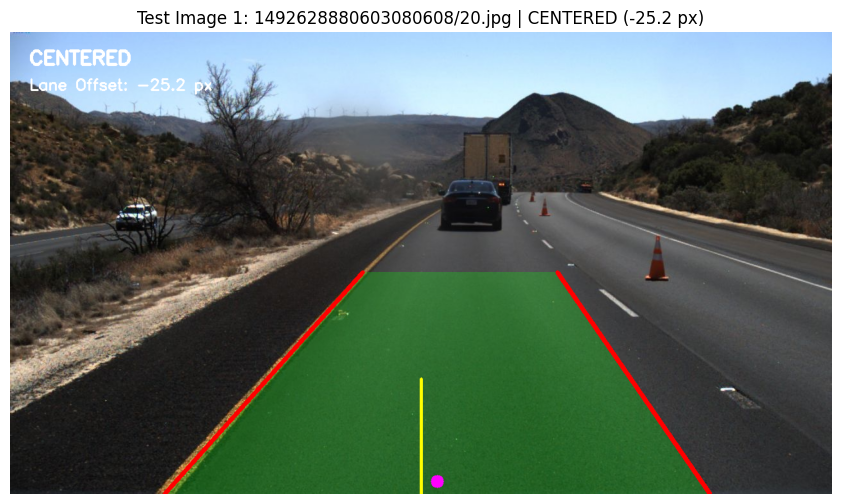

[2/6] 16.jpg | Status: CENTERED | Offset: -68.5 px


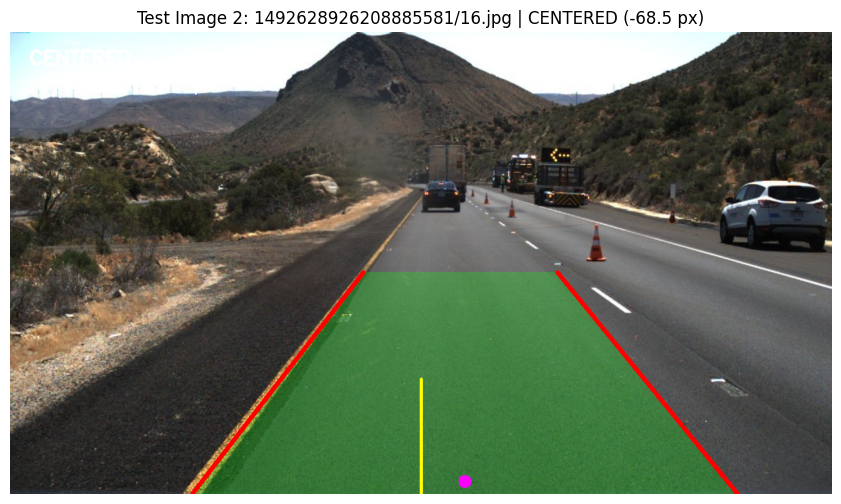

[3/6] 3.jpg | Status: CENTERED | Offset: 50.7 px


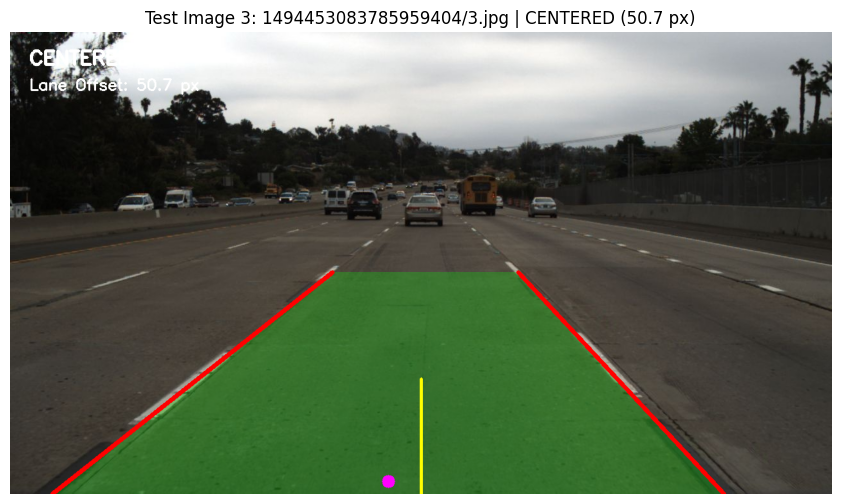

[4/6] 8.jpg | Status: CENTERED | Offset: -34.9 px


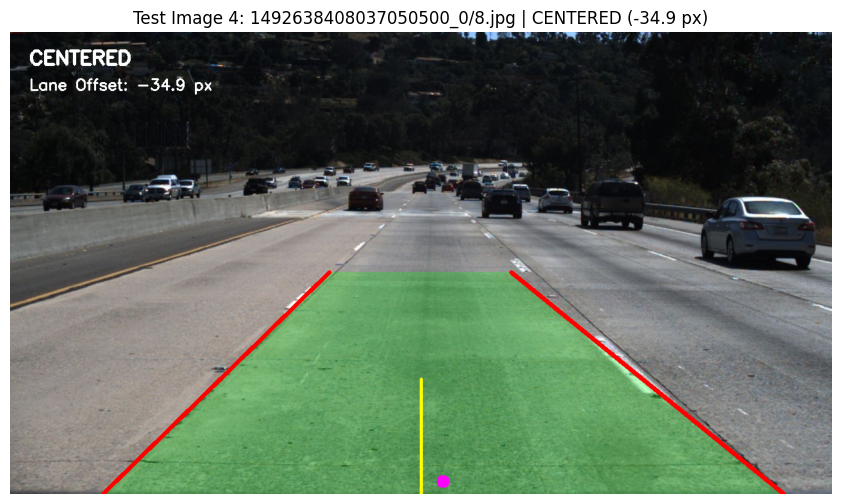

[5/6] 15.jpg | Status: CENTERED | Offset: -84.0 px


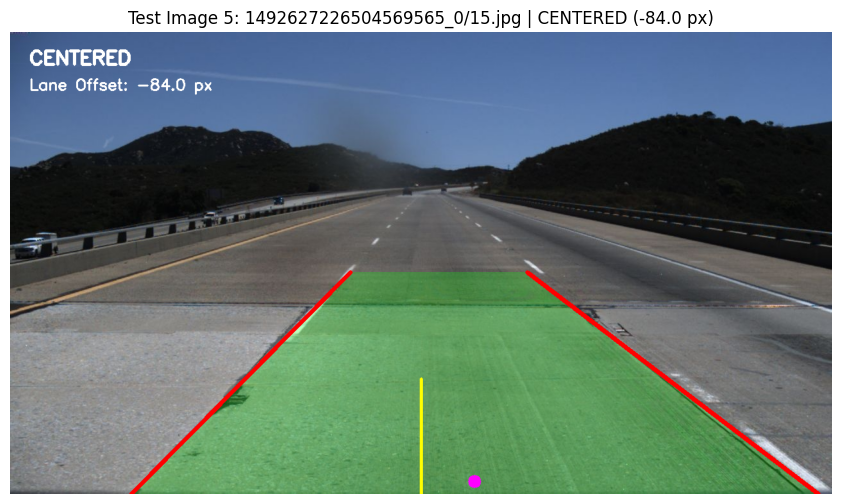

[6/6] 2.jpg | Status: CENTERED | Offset: 14.8 px


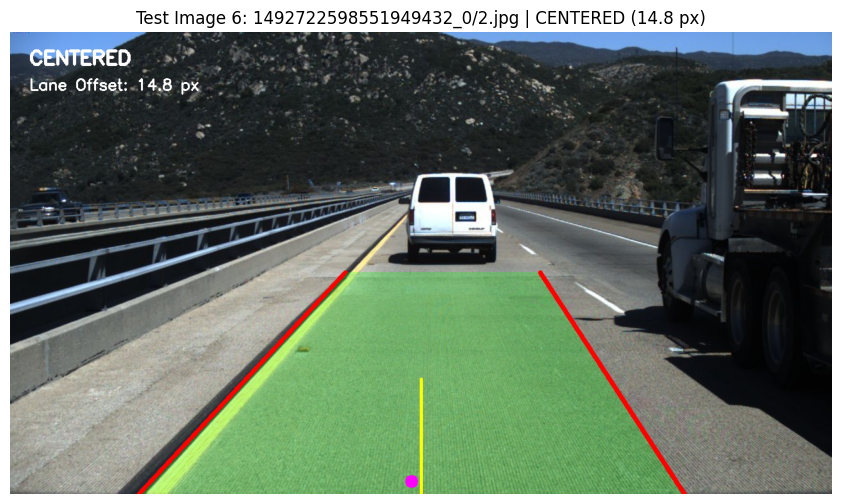

In [256]:
# Select 6 diverse test images from different clips in the dataset
num_samples = min(6, len(image_files))
indices = np.linspace(0, len(image_files) - 1, num_samples, dtype=int)
sample_images = [image_files[i] for i in indices]

print(f"Testing on {len(sample_images)} diverse test images from TuSimple dataset...\n")

for i, image_path in enumerate(sample_images):
    img = load_image(image_path)
    left_fit, right_fit = detect_lanes(img)
    result, status, offset = visualize_departure_warning(img, left_fit, right_fit)
    
    offset_text = f'{offset:.1f} px' if offset is not None else 'N/A'
    print(f"[{i+1}/{len(sample_images)}] {image_path.name} | Status: {status} | Offset: {offset_text}")
    
    plt.figure(figsize=(12, 6))
    plt.imshow(result)
    plt.title(f"Test Image {i+1}: {image_path.parent.name}/{image_path.name} | {status} ({offset_text})")
    plt.axis("off")
    plt.show()


# Failure Analysis

Classical lane detection can fail under difficult visual conditions.

Examples include:

- Faded lane markings
- Strong shadows
- Heavy rain
- Snow-covered roads
- Very sharp curves
- Occluded lane markings
- Poor illumination
- Complex intersections

These cases are useful for understanding the limitations of the current
computer vision pipeline.

In [257]:
results = []

for image_path in sample_images:
    img = load_image(image_path)
    left_fit, right_fit = detect_lanes(img)
    _, status, offset = visualize_departure_warning(img, left_fit, right_fit)
    
    results.append({
        "Image": image_path.name,
        "Left Lane Detected": left_fit is not None,
        "Right Lane Detected": right_fit is not None,
        "Offset (px)": None if offset is None else round(offset, 2),
        "Status": status
    })

import pandas as pd
results_df = pd.DataFrame(results)
results_df


,Image,Left Lane Detected,Right Lane Detected,Offset (px),Status
0,20.jpg,True,True,-25.20,CENTERED
1,16.jpg,True,True,-68.49,CENTERED
2,3.jpg,True,True,50.74,CENTERED
3,8.jpg,True,True,-34.95,CENTERED
4,15.jpg,True,True,-84.00,CENTERED
5,2.jpg,True,True,14.82,CENTERED


In [258]:
if len(image_files) > 0:
    example = load_image(image_files[0])
    
    left_fit, right_fit = detect_lanes(example)
    
    result, status, offset = visualize_departure_warning(
        example,
        left_fit,
        right_fit
    )
    
    result_bgr = cv2.cvtColor(
        result,
        cv2.COLOR_RGB2BGR
    )
    
    output_image = OUTPUT_DIR / "example_lane_result.jpg"
    
    cv2.imwrite(
        str(output_image),
        result_bgr
    )
    
    print("Saved:", output_image)

Saved: /kaggle/working/example_lane_result.jpg


# Conclusion

This project developed a computer vision pipeline for lane detection and
road-departure warning.

The system combines:

1. Image preprocessing
2. Canny edge detection
3. Region-of-interest extraction
4. Hough-based lane detection
5. Lane boundary fitting
6. Polynomial fitting for curved lanes
7. Temporal smoothing
8. Lane-center estimation
9. Departure warning logic
10. Video processing

The project demonstrates how classical computer vision techniques can be
combined to build a practical road-scene analysis system.

## Limitations

The current system relies on visible lane markings and fixed camera geometry.
It is not intended to replace a production autonomous-driving or safety
system.

Future improvements could include:

- Perspective transformation to bird's-eye view
- Camera calibration
- Robust lane segmentation
- Deep-learning-based lane detection
- Vehicle detection
- Road-surface classification
- Weather-aware lane detection
- More robust temporal tracking

## Project

### LaneGuard — Lane Detection & Road Departure Warning

A computer vision system for detecting lane boundaries from road images and
videos and estimating the camera's position relative to the detected lane
center. The system combines classical image-processing techniques including
Canny edge detection, region-of-interest extraction, Hough line detection,
polynomial lane fitting, and temporal smoothing.

The final pipeline processes road video and provides visual lane overlays,
lane-center estimation, lateral offset measurements, and road-departure
warnings.